## ARIMA

- ARIMA (AutoRegressive Integrated Moving Average) is a statistical model used for time series forecasting. It is a combination of three components: autoregression (AR), differencing (I), and moving average (MA) which work together to forecast future values based on past values and the residuals (differences between actual and predicted values). ARIMA models can handle non-stationary data by taking differences of the series until it becomes stationary, allowing for accurate forecasting.

- ARIMA is composed of 3 terms(Auto-Regression + Integrated + Moving-Average)

https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/

In [1]:
# Import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import lime

from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from math import sqrt
from lime import lime_tabular
from rich import print


# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")


In [2]:
# Checking for stationarity of the time series

df_arima = pd.read_csv('dataframe.csv', index_col=0, parse_dates=True)

def adf_test(time_series):
    result = adfuller(time_series)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))


for col in df_arima.columns:
    time_series = df_arima[col]
    print(f"[bold]\nStationarity test for column '{col}':")
    adf_test(time_series)

Stationarity test for column 'Cabbage':

ADF Statistic: -4.328974

p-value: 0.000396

Critical Values:

1%: -3.456

5%: -2.873

10%: -2.573

Stationarity test for column 'Green_Onion':

ADF Statistic: -3.679380

p-value: 0.004413

Critical Values:

1%: -3.456

5%: -2.873

10%: -2.573

Stationarity test for column 'Lettuce':

ADF Statistic: -4.865642

p-value: 0.000041

Critical Values:

1%: -3.456

5%: -2.873

10%: -2.573

Stationarity test for column 'Potatoes':

ADF Statistic: -2.114732

p-value: 0.238632

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

Stationarity test for column 'Onion':

ADF Statistic: -2.331830

p-value: 0.161907

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

Stationarity test for column 'Cucumber':

ADF Statistic: -3.828115

p-value: 0.002632

Critical Values:

1%: -3.456

5%: -2.873

10%: -2.573

Stationarity test for column 'Tomato':

ADF Statistic: -4.384285

p-value: 0.000316

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

Stationarity test for column 'Chinese_Cabbage':

ADF Statistic: -3.279808

p-value: 0.015806

Critical Values:

1%: -3.456

5%: -2.873

10%: -2.573

Stationarity test for column 'Radish':

ADF Statistic: -3.871504

p-value: 0.002255

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

The results of the Augmented Dickey-Fuller (ADF) test:
- ADF Statistic: This is the test statistic of the ADF test, which measures the difference between the observed time series and its lagged difference. A negative ADF Statistic means that the time series is stationary, while a positive ADF Statistic means that the time series is not stationary.
- p-value: This is the probability of observing a test statistic as extreme as the one calculated, given that the null hypothesis is true. The null hypothesis states that the time series is not stationary. If the p-value is less than a significance level (e.g., 0.05), then we reject the null hypothesis and conclude that the time series is stationary.
- Critical Values: These are the threshold values that are used to determine if the time series is stationary or not. If the ADF Statistic is less than the critical value, then the time series is considered stationary. In the results, the critical values for different confidence levels (e.g., 1%, 5%, and 10%) are provided. The lower the confidence level, the more stringent the test, and the lower the critical value.

For the critical value at 1% significance level:

- Based on the results, columns 'Cabbage', 'Lettuce', 'Tomato', 'Cucumber', 'Radish' and 'Chinese_Cabbage' are stationary since their ADF statistic is less than the critical value at 1% significance level and the p-value is below 0.05. Columns 'Green_Onion', 'Potatoes', and 'Carrot' have a p-value above 0.05, suggesting that they are not stationary. Column 'Onion' has an ADF statistic that is greater than the critical value at 1% significance level and a p-value above 0.05, further suggesting that it is not stationary.
- `Cabbage`, `Lettuce`, `Tomato`, `Cucumber`, `Radish` and `Chinese_Cabbage` are stationary.
- `Green_Onion`, `Potatoes`, `Carrot`, and `Onion` are not stationary

For the critical value at 5% significance level:

- Using the 5% significance level, columns `Cabbage`, `Lettuce`, `Tomato`, `Cucumber`, `Radish`, `Green_Onion`, `Carrot` and `Chinese_Cabbage` are stationary since their ADF statistic is less than the critical value at 5% significance level and the p-value is below 0.05. 
- `Potatoes` and  `Onion`  are not stationary.

I'm going to take the critical value at 5% significance level. ARIMA assumes that the input time series is stationary. If I apply ARIMA on non-stationary time series data, it can result in unstable or ineffective predictions. 

In [3]:
# select the non-stationary columns
non_stationary_columns = ['Onion', 'Potatoes']

# set maximum number of iterations for while loop
max_iterations = 1

# difference the non-stationary columns until they become stationary
for column in non_stationary_columns:
    i = 0
    print(f"[bold]\nStationarity test for column '{column}':")
    while not adf_test(df_arima[column]) and i < max_iterations:
        df_arima[column] = df_arima[column].diff()
        df_arima[column] = df_arima[column].fillna(df_arima[column].median())
        i += 1

Stationarity test for column 'Onion':

ADF Statistic: -2.331830

p-value: 0.161907

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

ADF Statistic: -3.973449

p-value: 0.001556

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

Stationarity test for column 'Potatoes':

ADF Statistic: -2.114732

p-value: 0.238632

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

ADF Statistic: -5.844270

p-value: 0.000000

Critical Values:

1%: -3.457

5%: -2.873

10%: -2.573

In [4]:
# Split Data into Training and Testing
print(df_arima.shape)
train = df_arima.loc[:'2022-01-03']
test = df_arima.loc['2022-01-03':]
print(train.shape,test.shape)

(262, 9)

(222, 9)
(41, 9)

In [5]:
stepwise_fit = auto_arima(df_arima['Cabbage'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2201.737, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2261.747, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2203.121, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2206.415, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2259.747, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2204.537, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2201.797, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2202.982, Time=0.07 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2202.075, Time=0.23 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2202.456, Time=0.20 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2201.090, Time=0.41 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=2202.087, Time=0.48 sec
 ARIMA(3,1,4)(0,0,0)[0] intercept   : AIC=2

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(4, 1, 4)   Log Likelihood               -1088.703
Date:                Sun, 30 Jul 2023   AIC                           2195.406
Time:                        16:09:44   BIC                           2227.487
Sample:                             0   HQIC                          2208.301
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4803      0.540      0.889      0.374      -0.579       1.540
ar.L2          0.5261      0.366      1.436      0.151      -0.192       1.244
ar.L3         -0.2434      0.460     -0.529      0.597      -1.146       0.659
ar.L4          0.0665      0.314      0.212      0.832      -0.549       0.682
ma.L1         -0.0287      0.532     -0.054      0.957      -1.072       1.014
ma.L2         -0.6182      0.208     -2.968      0.003      -1.026      -0.210
ma.L3         -0.0819      0.519     -0.158      0.875      -1.099       0.935
ma.L4         -0.2314      0.150     -1.538      0.124      -0.526       0.063
sigma2       264.6490     18.746     14.118      0.000     227.908     301.390
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               197.02
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.22   Skew:                             0.87
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

- The parameters of an ARIMA model are:
    - p: The number of autoregressive terms (lags) used in the model. A lag is the time interval between the current observation and the observation used to predict it.

    - d: The degree of differencing used in the model. This represents the number of times the data needs to be differenced to make it stationary.

    - q: The number of moving average terms used in the model. Moving average terms represent the error of the forecast based on a moving average of past errors.
- Best model ARIMA(4,1,4).
- SARIMAX is an ARIMA model with seasonality. But we got Best model:  ARIMA(4,1,4)(0,0,0)[0]. Since (0,0,0), there is no seasonality. So this is simply an ARIMA Model.

### Cabbage Forecasting

In [6]:
# Train the Model
# The ARIMA parameters are p, d, and q. The p parameter is the number of autoregressive terms, 
# the d parameter is the degree of differencing, and the q parameter is the number of moving average terms.

model = ARIMA(train['Cabbage'],order=(30,1,20)) #30,1,20
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                Cabbage   No. Observations:                  222
Model:               ARIMA(30, 1, 20)   Log Likelihood                -907.739
Date:                Fri, 28 Jul 2023   AIC                           1917.477
Time:                        13:46:27   BIC                           2090.783
Sample:                             0   HQIC                          1987.455
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2780      1.521      0.183      0.855      -2.703       3.259
ar.L2          0.0686      1.730      0.040      0.968      -3.323       3.460
ar.L3          0.1370      1.656      0.083      0.934      -3.109       3.383
ar.L4         -0.1766      1.790     -0.099      0.921      -3.685       3.332
ar.L5         -0.0851      2.039     -0.042      0.967      -4.080       3.910
ar.L6          0.0984      1.829      0.054      0.957      -3.486       3.683
ar.L7         -0.0971      1.688     -0.058      0.954      -3.406       3.211
ar.L8          0.4150      1.539      0.270      0.787      -2.602       3.432
ar.L9          0.1211      0.922      0.131      0.896      -1.686       1.928
ar.L10        -0.0439      1.115     -0.039      0.969      -2.229       2.142
ar.L11        -0.1819      1.112     -0.164      0.870      -2.362       1.998
ar.L12        -0.1787      0.888     -0.201      0.841      -1.920       1.562
ar.L13         0.2813      1.088      0.259      0.796      -1.851       2.414
ar.L14        -0.0917      1.453     -0.063      0.950      -2.940       2.756
ar.L15        -0.0452      1.560     -0.029      0.977      -3.103       3.012
ar.L16        -0.1160      1.492     -0.078      0.938      -3.041       2.809
ar.L17        -0.1314      1.635     -0.080      0.936      -3.336       3.074
ar.L18        -0.0630      1.422     -0.044      0.965      -2.850       2.724
ar.L19         0.0048      1.530      0.003      0.997      -2.994       3.004
ar.L20         0.3158      1.502      0.210      0.833      -2.629       3.260
ar.L21        -0.2893      1.050     -0.276      0.783      -2.347       1.768
ar.L22         0.2239      0.636      0.352      0.725      -1.023       1.470
ar.L23         0.0767      0.336      0.228      0.819      -0.582       0.735
ar.L24         0.0991      0.449      0.221      0.825      -0.782       0.980
ar.L25        -0.1311      0.315     -0.417      0.677      -0.748       0.486
ar.L26         0.0278      0.171      0.162      0.871      -0.307       0.363
ar.L27        -0.1158      0.176     -0.656      0.512      -0.462       0.230
ar.L28         0.1890      0.175      1.080      0.280      -0.154       0.532
ar.L29         0.0434      0.395      0.110      0.913      -0.731       0.817
ar.L30        -0.1789      0.307     -0.583      0.560      -0.781       0.423
ma.L1          0.2293      1.522      0.151      0.880      -2.754       3.213
ma.L2         -0.0028      1.270     -0.002      0.998      -2.493       2.487
ma.L3         -0.2350      1.352     -0.174      0.862      -2.885       2.415
ma.L4         -0.1068      1.376     -0.078      0.938      -2.804       2.591
ma.L5          0.0205      1.331      0.015      0.988      -2.588       2.628
ma.L6         -0.0673      1.155     -0.058      0.954      -2.330       2.196
ma.L7          0.1255      1.186      0.106      0.916      -2.198       2.449
ma.L8         -0.4184      1.023     -0.409      0.682      -2.423       1.586
ma

In [7]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
pred.head()

2022-01-03    166.129634
2022-01-10    173.385516
2022-01-17    178.838257
2022-01-24    170.720630
2022-01-31    163.661218
Name: ARIMA Predictions, dtype: float64

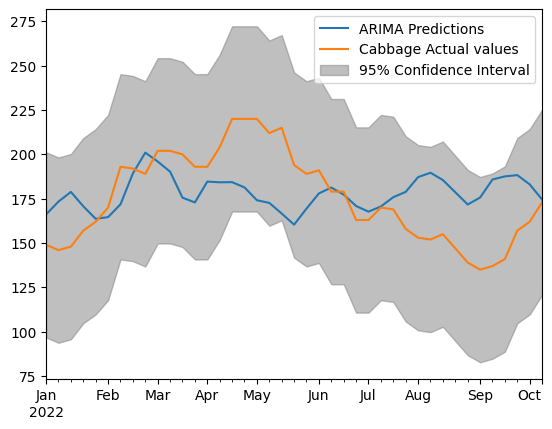

In [9]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Cabbage'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Cabbage'] - 1.96 * std_dev
upper_bound = test['Cabbage'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Cabbage'].plot(legend=True, label='Cabbage Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [10]:
# RMSE
test['Cabbage'].mean()
rmse=sqrt(mean_squared_error(pred,test['Cabbage']))
print(rmse)

26.450819695734115

### Green_Onion Forecasting

In [11]:
stepwise_fit = auto_arima(df_arima['Green_Onion'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2511.636, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3239.594, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2568.906, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2940.699, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4201.365, Time=0.00 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2510.094, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2759.719, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2517.911, Time=0.11 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2511.784, Time=0.18 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2649.282, Time=0.29 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2509.736, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2507.897, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2509.744, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2511.728, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0]          

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(2, 0, 0)   Log Likelihood               -1249.948
Date:                Fri, 28 Jul 2023   AIC                           2507.897
Time:                        13:52:20   BIC                           2522.170
Sample:                             0   HQIC                          2513.633
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     40.9941     12.231      3.352      0.001      17.023      64.965
ar.L1          1.4039      0.046     30.809      0.000       1.315       1.493
ar.L2         -0.4605      0.045    -10.323      0.000      -0.548      -0.373
sigma2       805.8289     26.237     30.713      0.000     754.404     857.253
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):              3651.65
Prob(Q):                              0.80   Prob(JB):                         0.00
Heteroskedasticity (H):               0.49   Skew:                             2.17
Prob(H) (two-sided):                  0.00   Kurtosis:                        20.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [12]:
model = ARIMA(train['Green_Onion'],order=(30,1,20))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:            Green_Onion   No. Observations:                  222
Model:               ARIMA(30, 1, 20)   Log Likelihood               -1053.769
Date:                Fri, 28 Jul 2023   AIC                           2209.538
Time:                        13:52:29   BIC                           2382.845
Sample:                             0   HQIC                          2279.516
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2879      9.670      0.030      0.976     -18.665      19.241
ar.L2         -0.3181      9.663     -0.033      0.974     -19.257      18.621
ar.L3         -0.3503      9.657     -0.036      0.971     -19.277      18.576
ar.L4          0.0574      3.471      0.017      0.987      -6.746       6.861
ar.L5         -0.1366      2.203     -0.062      0.951      -4.455       4.182
ar.L6         -0.3775      1.623     -0.233      0.816      -3.559       2.804
ar.L7          0.0583      3.702      0.016      0.987      -7.197       7.314
ar.L8         -0.0090      3.401     -0.003      0.998      -6.675       6.657
ar.L9         -0.4354      2.863     -0.152      0.879      -6.046       5.175
ar.L10         0.2306      3.038      0.076      0.940      -5.724       6.185
ar.L11        -0.1146      4.337     -0.026      0.979      -8.615       8.386
ar.L12        -0.1597      4.167     -0.038      0.969      -8.327       8.007
ar.L13         0.0977      1.674      0.058      0.953      -3.183       3.379
ar.L14         0.0604      1.366      0.044      0.965      -2.616       2.737
ar.L15        -0.0994      1.228     -0.081      0.935      -2.506       2.307
ar.L16         0.1307      1.430      0.091      0.927      -2.672       2.933
ar.L17        -0.1116      2.099     -0.053      0.958      -4.225       4.002
ar.L18         0.1945      2.416      0.081      0.936      -4.540       4.929
ar.L19         0.1871      3.155      0.059      0.953      -5.997       6.371
ar.L20        -0.0888      0.965     -0.092      0.927      -1.980       1.802
ar.L21        -0.1217      1.579     -0.077      0.939      -3.216       2.972
ar.L22        -0.0606      0.222     -0.273      0.785      -0.495       0.374
ar.L23        -0.1273      0.733     -0.174      0.862      -1.564       1.309
ar.L24        -0.0926      0.723     -0.128      0.898      -1.510       1.325
ar.L25        -0.0522      0.461     -0.113      0.910      -0.956       0.852
ar.L26        -0.0877      0.235     -0.373      0.709      -0.548       0.373
ar.L27        -0.1564      0.779     -0.201      0.841      -1.683       1.370
ar.L28        -0.0482      0.961     -0.050      0.960      -1.932       1.835
ar.L29        -0.1627      0.239     -0.680      0.497      -0.632       0.306
ar.L30        -0.1208      1.673     -0.072      0.942      -3.400       3.158
ma.L1          0.0286      9.655      0.003      0.998     -18.895      18.952
ma.L2          0.2685      6.648      0.040      0.968     -12.761      13.298
ma.L3          0.3397      6.989      0.049      0.961     -13.359      14.039
ma.L4         -0.0069      2.018     -0.003      0.997      -3.963       3.949
ma.L5          0.0515      1.530      0.034      0.973      -2.947       3.050
ma.L6          0.2105      1.323      0.159      0.874      -2.383       2.804
ma.L7         -0.0349      2.407     -0.015      0.988      -4.752       4.682
ma.L8         -0.1307      2.349     -0.056      0.956      -4.736       4.474
ma

In [13]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    517.702740
2022-01-10    532.846000
2022-01-17    549.350054
2022-01-24    556.804566
2022-01-31    554.104806
2022-02-07    566.079794
2022-02-14    585.227610
2022-02-21    592.374276
2022-02-28    603.711229
2022-03-07    607.655551
2022-03-14    619.822727
2022-03-21    652.937415
2022-03-28    688.020744
2022-04-04    718.823093
2022-04-11    742.792800
2022-04-18    774.406415
2022-04-25    803.728398
2022-05-02    803.325502
2022-05-09    791.898286
2022-05-16    789.041410
2022-05-23    793.567127
2022-05-30    797.186313
2022-06-06    791.128531
2022-06-13    786.823347
2022-06-20    790.668164
2022-06-27    794.877426
2022-07-04    800.513473
2022-07-11    800.094896
2022-07-18    794.435072
2022-07-25    793.352908
2022-08-01    795.919238
2022-08-08    796.965374
2022-08-15    787.351305
2022-08-22    774.501421
2022-08-29    769.240759
2022-09-05    756.442239
2022-09-12    732.602087
2022-09-19    710.148624
2022-09-26    699.992098
2022-10-03    699.781635
2022-10-10    694.905016
Name: ARIMA Predictions, dtype: float64

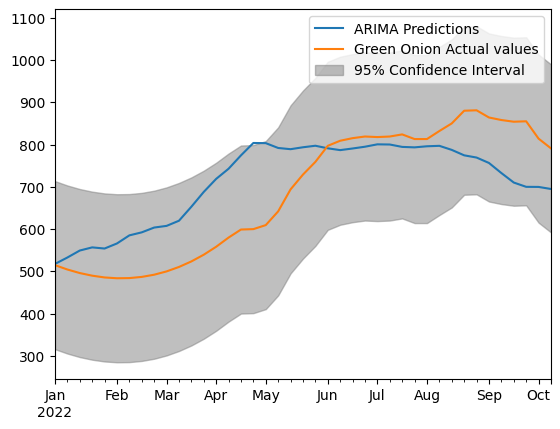

In [14]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Green_Onion'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Green_Onion'] - 1.96 * std_dev
upper_bound = test['Green_Onion'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Green_Onion'].plot(legend=True, label='Green Onion Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [15]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Green_Onion'].mean()
rmse=sqrt(mean_squared_error(pred,test['Green_Onion']))
print(rmse)

103.81285727885978

### Lettuce Forecasting

In [16]:
stepwise_fit = auto_arima(df_arima['Lettuce'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2823.317, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2905.430, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2836.830, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2848.332, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2903.472, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2834.111, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2825.315, Time=0.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2825.314, Time=0.35 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2837.637, Time=0.11 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2831.767, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2827.045, Time=0.18 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2826.335, Time=0.43 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=2821.331, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(2, 1, 1)   Log Likelihood               -1406.292
Date:                Fri, 28 Jul 2023   AIC                           2820.585
Time:                        13:53:29   BIC                           2834.843
Sample:                             0   HQIC                          2826.316
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4503      0.036     40.120      0.000       1.379       1.521
ar.L2         -0.5351      0.035    -15.274      0.000      -0.604      -0.466
ma.L1         -0.9858      0.023    -42.809      0.000      -1.031      -0.941
sigma2      2786.2706    187.482     14.862      0.000    2418.812    3153.729
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):                52.24
Prob(Q):                              0.72   Prob(JB):                         0.00
Heteroskedasticity (H):               0.54   Skew:                             0.41
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [17]:
model = ARIMA(train['Lettuce'],order=(30,1,20))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                Lettuce   No. Observations:                  222
Model:               ARIMA(30, 1, 20)   Log Likelihood               -1170.287
Date:                Fri, 28 Jul 2023   AIC                           2442.573
Time:                        13:53:38   BIC                           2615.880
Sample:                             0   HQIC                          2512.551
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0737      0.687     -0.107      0.915      -1.421       1.274
ar.L2          0.5276      0.752      0.701      0.483      -0.947       2.002
ar.L3          0.1905      0.403      0.473      0.636      -0.599       0.980
ar.L4         -0.1865      0.280     -0.666      0.505      -0.736       0.362
ar.L5          0.1073      0.367      0.293      0.770      -0.611       0.826
ar.L6          0.0295      0.274      0.108      0.914      -0.508       0.567
ar.L7         -0.0617      0.263     -0.235      0.814      -0.576       0.453
ar.L8          0.0474      0.287      0.165      0.869      -0.516       0.610
ar.L9          0.1426      0.247      0.577      0.564      -0.342       0.627
ar.L10        -0.0363      0.179     -0.203      0.839      -0.387       0.315
ar.L11        -0.3306      0.201     -1.643      0.100      -0.725       0.064
ar.L12         0.2396      0.330      0.727      0.467      -0.406       0.886
ar.L13         0.4386      0.197      2.228      0.026       0.053       0.824
ar.L14         0.1258      0.225      0.559      0.576      -0.315       0.567
ar.L15         0.0482      0.267      0.181      0.857      -0.475       0.572
ar.L16        -0.1511      0.298     -0.507      0.612      -0.735       0.433
ar.L17        -0.6865      0.198     -3.460      0.001      -1.075      -0.298
ar.L18         0.0624      0.347      0.180      0.857      -0.618       0.743
ar.L19         0.3027      0.306      0.989      0.323      -0.297       0.903
ar.L20        -0.1570      0.206     -0.763      0.446      -0.560       0.246
ar.L21        -0.1730      0.221     -0.785      0.433      -0.605       0.259
ar.L22         0.2573      0.296      0.871      0.384      -0.322       0.837
ar.L23         0.0809      0.160      0.507      0.612      -0.232       0.394
ar.L24        -0.1798      0.150     -1.197      0.231      -0.474       0.115
ar.L25         0.0298      0.215      0.138      0.890      -0.392       0.452
ar.L26         0.1296      0.184      0.703      0.482      -0.232       0.491
ar.L27        -0.1371      0.131     -1.049      0.294      -0.393       0.119
ar.L28        -0.2755      0.176     -1.568      0.117      -0.620       0.069
ar.L29         0.0379      0.313      0.121      0.904      -0.576       0.651
ar.L30         0.3748      0.268      1.397      0.163      -0.151       0.901
ma.L1          0.5857      1.089      0.538      0.591      -1.550       2.721
ma.L2         -0.1526      3.516     -0.043      0.965      -7.044       6.738
ma.L3         -0.4979      1.446     -0.344      0.731      -3.332       2.336
ma.L4         -0.4645      3.785     -0.123      0.902      -7.883       6.954
ma.L5         -0.3394      2.028     -0.167      0.867      -4.315       3.636
ma.L6          0.1761      2.817      0.063      0.950      -5.346       5.698
ma.L7          0.1290      0.982      0.131      0.896      -1.797       2.055
ma.L8         -0.0724      2.274     -0.032      0.975      -4.529       4.384
ma

In [18]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    457.480072
2022-01-10    332.981954
2022-01-17    296.923993
2022-01-24    319.934261
2022-01-31    367.232538
2022-02-07    438.471558
2022-02-14    470.512419
2022-02-21    458.100390
2022-02-28    430.281312
2022-03-07    367.645773
2022-03-14    325.107131
2022-03-21    336.576083
2022-03-28    392.175515
2022-04-04    483.109268
2022-04-11    522.510225
2022-04-18    512.554406
2022-04-25    469.172853
2022-05-02    476.311865
2022-05-09    498.940742
2022-05-16    523.695727
2022-05-23    566.861987
2022-05-30    555.907000
2022-06-06    484.756450
2022-06-13    418.855151
2022-06-20    373.138840
2022-06-27    365.955054
2022-07-04    412.516816
2022-07-11    490.981011
2022-07-18    560.412319
2022-07-25    563.310947
2022-08-01    523.404321
2022-08-08    457.311645
2022-08-15    447.990477
2022-08-22    462.967161
2022-08-29    453.470736
2022-09-05    457.970900
2022-09-12    433.312269
2022-09-19    382.323796
2022-09-26    362.127249
2022-10-03    375.992701
2022-10-10    414.710120
Name: ARIMA Predictions, dtype: float64

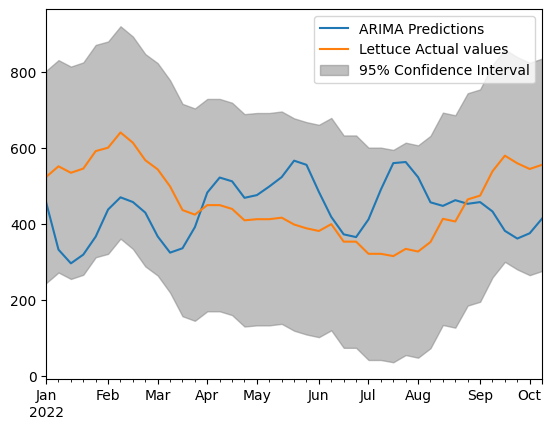

In [19]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Lettuce'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Lettuce'] - 1.96 * std_dev
upper_bound = test['Lettuce'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Lettuce'].plot(legend=True, label='Lettuce Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [20]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Lettuce'].mean()
rmse=sqrt(mean_squared_error(pred,test['Lettuce']))
print(rmse)

142.07717221123917

### Potatoes Forecasting

In [21]:
stepwise_fit = auto_arima(df_arima['Potatoes'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2365.531, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2395.411, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2396.453, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2396.536, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2393.420, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2381.049, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2395.364, Time=0.10 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2368.739, Time=0.15 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2354.753, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2352.890, Time=0.13 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2350.912, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2395.303, Time=0.06 sec
 ARIMA(0,0,4)(0,0,0)[0] intercept   : AIC=2352.893, Time=0.11 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,3)(0,0,0)[0]             : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(1, 0, 4)   Log Likelihood               -1165.878
Date:                Fri, 28 Jul 2023   AIC                           2343.757
Time:                        13:54:25   BIC                           2365.167
Sample:                             0   HQIC                          2352.362
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8800      0.046     19.062      0.000       0.790       0.970
ma.L1         -1.0223      0.050    -20.397      0.000      -1.121      -0.924
ma.L2          0.1341      0.043      3.130      0.002       0.050       0.218
ma.L3          0.4012      0.035     11.408      0.000       0.332       0.470
ma.L4         -0.4745      0.023    -20.659      0.000      -0.519      -0.429
sigma2       427.1313     13.933     30.657      0.000     399.824     454.439
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):              4548.19
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):              30.98   Skew:                            -0.47
Prob(H) (two-sided):                  0.00   Kurtosis:                        23.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [22]:
model = ARIMA(train['Potatoes'],order=(30,1,20))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               Potatoes   No. Observations:                  222
Model:               ARIMA(30, 1, 20)   Log Likelihood                -983.197
Date:                Fri, 28 Jul 2023   AIC                           2068.394
Time:                        13:54:35   BIC                           2241.700
Sample:                             0   HQIC                          2138.372
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6758      3.498     -0.479      0.632      -8.532       5.180
ar.L2         -1.3969      5.139     -0.272      0.786     -11.470       8.676
ar.L3         -0.6870      5.164     -0.133      0.894     -10.808       9.433
ar.L4         -0.0986      4.990     -0.020      0.984      -9.879       9.682
ar.L5          0.0246      4.734      0.005      0.996      -9.255       9.304
ar.L6         -0.6997      4.453     -0.157      0.875      -9.427       8.027
ar.L7         -1.4327      4.904     -0.292      0.770     -11.044       8.179
ar.L8         -1.6503      5.124     -0.322      0.747     -11.693       8.393
ar.L9         -1.0394      4.354     -0.239      0.811      -9.574       7.495
ar.L10        -0.3256      2.854     -0.114      0.909      -5.920       5.269
ar.L11         0.1144      2.975      0.038      0.969      -5.717       5.946
ar.L12        -0.0418      2.412     -0.017      0.986      -4.770       4.686
ar.L13        -0.6836      2.143     -0.319      0.750      -4.884       3.517
ar.L14        -1.0014      2.610     -0.384      0.701      -6.117       4.115
ar.L15        -0.3939      2.565     -0.154      0.878      -5.421       4.633
ar.L16         0.2308      2.295      0.101      0.920      -4.267       4.728
ar.L17         0.3254      2.679      0.121      0.903      -4.926       5.577
ar.L18         0.1729      2.120      0.082      0.935      -3.981       4.327
ar.L19        -0.3510      1.283     -0.274      0.784      -2.866       2.164
ar.L20        -0.6626      1.757     -0.377      0.706      -4.106       2.781
ar.L21        -0.5854      1.909     -0.307      0.759      -4.326       3.156
ar.L22        -0.2586      1.624     -0.159      0.873      -3.441       2.923
ar.L23        -0.0924      1.476     -0.063      0.950      -2.986       2.801
ar.L24        -0.1178      1.423     -0.083      0.934      -2.907       2.671
ar.L25        -0.2881      1.225     -0.235      0.814      -2.690       2.114
ar.L26        -0.3738      1.194     -0.313      0.754      -2.715       1.967
ar.L27        -0.2954      1.172     -0.252      0.801      -2.592       2.001
ar.L28        -0.1406      1.028     -0.137      0.891      -2.155       1.874
ar.L29        -0.1243      0.965     -0.129      0.897      -2.015       1.766
ar.L30        -0.0461      0.617     -0.075      0.940      -1.255       1.162
ma.L1          0.5083     34.032      0.015      0.988     -66.193      67.210
ma.L2         -0.3733     19.559     -0.019      0.985     -38.709      37.962
ma.L3         -0.1933     44.267     -0.004      0.997     -86.955      86.569
ma.L4         -0.2812     70.022     -0.004      0.997    -137.521     136.959
ma.L5         -0.3027     56.532     -0.005      0.996    -111.104     110.498
ma.L6          0.3218     10.204      0.032      0.975     -19.677      20.320
ma.L7          0.1770     66.423      0.003      0.998    -130.009     130.363
ma.L8         -0.1172     98.504     -0.001      0.999    -193.181     192.946
ma

In [23]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    4.045213
2022-01-10    9.652107
2022-01-17    3.055448
2022-01-24    3.295239
2022-01-31    1.586838
2022-02-07   -3.957745
2022-02-14   -0.773748
2022-02-21   -2.040491
2022-02-28    0.154325
2022-03-07    2.512972
2022-03-14    0.856105
2022-03-21    1.779392
2022-03-28   -1.581713
2022-04-04   -3.429522
2022-04-11   -5.981115
2022-04-18   -2.047616
2022-04-25   -3.838363
2022-05-02   -1.757567
2022-05-09    0.845541
2022-05-16    1.711152
2022-05-23    2.160156
2022-05-30    3.072942
2022-06-06    0.701540
2022-06-13    0.307114
2022-06-20    1.055387
2022-06-27    0.350713
2022-07-04    1.389885
2022-07-11   -1.313482
2022-07-18   -0.407504
2022-07-25    0.445144
2022-08-01    0.603582
2022-08-08    0.734221
2022-08-15   -0.109987
2022-08-22    3.542781
2022-08-29    1.702211
2022-09-05    3.190498
2022-09-12    2.235305
2022-09-19    1.083843
2022-09-26    0.428407
2022-10-03    0.102459
2022-10-10   -0.452683
Name: ARIMA Predictions, dtype: float64

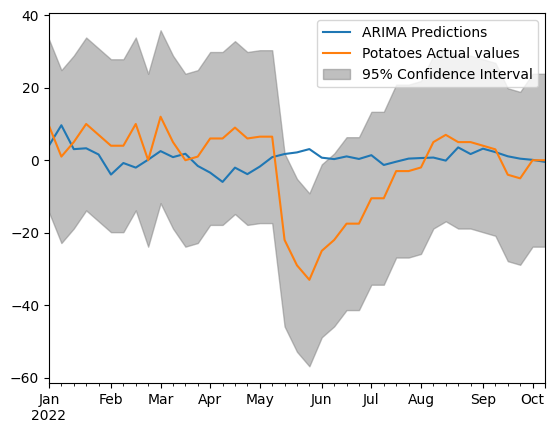

In [24]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Potatoes'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Potatoes'] - 1.96 * std_dev
upper_bound = test['Potatoes'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Potatoes'].plot(legend=True, label='Potatoes Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [25]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Potatoes'].mean()
rmse=sqrt(mean_squared_error(pred,test['Potatoes']))
print(rmse)

12.224965184813879

### Onion Forecasting

In [26]:
stepwise_fit = auto_arima(df_arima['Onion'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2538.212, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2637.907, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2580.895, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2554.608, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2635.908, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2548.223, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2536.317, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2553.776, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2534.659, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2536.283, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2537.377, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2532.670, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2578.899, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2534.293, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]          

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(2, 0, 0)   Log Likelihood               -1263.335
Date:                Fri, 28 Jul 2023   AIC                           2532.670
Time:                        13:55:52   BIC                           2543.375
Sample:                             0   HQIC                          2536.972
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6326      0.022    -28.150      0.000      -0.677      -0.589
ar.L2         -0.4084      0.019    -21.193      0.000      -0.446      -0.371
sigma2       901.0830     17.733     50.815      0.000     866.327     935.839
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):             16064.84
Prob(Q):                              0.83   Prob(JB):                         0.00
Heteroskedasticity (H):              17.26   Skew:                             4.20
Prob(H) (two-sided):                  0.00   Kurtosis:                        40.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [27]:
model = ARIMA(train['Onion'],order=(30,1,20))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Onion   No. Observations:                  222
Model:               ARIMA(30, 1, 20)   Log Likelihood               -1041.975
Date:                Fri, 28 Jul 2023   AIC                           2185.949
Time:                        13:56:00   BIC                           2359.255
Sample:                             0   HQIC                          2255.927
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8561     16.185     -0.053      0.958     -32.578      30.866
ar.L2         -0.8340     24.129     -0.035      0.972     -48.125      46.457
ar.L3         -0.1987     29.869     -0.007      0.995     -58.742      58.344
ar.L4         -0.5415     25.740     -0.021      0.983     -50.991      49.908
ar.L5         -1.2420     25.445     -0.049      0.961     -51.113      48.629
ar.L6         -1.4701     33.596     -0.044      0.965     -67.317      64.377
ar.L7         -1.2479     40.496     -0.031      0.975     -80.619      78.123
ar.L8         -0.8507     40.716     -0.021      0.983     -80.652      78.950
ar.L9         -0.9217     37.014     -0.025      0.980     -73.467      71.624
ar.L10        -0.8732     37.680     -0.023      0.982     -74.725      72.979
ar.L11        -1.2166     37.488     -0.032      0.974     -74.692      72.259
ar.L12        -1.2066     40.496     -0.030      0.976     -80.576      78.163
ar.L13        -1.0673     40.956     -0.026      0.979     -81.340      79.205
ar.L14        -0.6989     38.166     -0.018      0.985     -75.504      74.106
ar.L15        -0.5933     31.848     -0.019      0.985     -63.014      61.828
ar.L16        -0.3446     27.189     -0.013      0.990     -53.634      52.945
ar.L17        -0.5855     21.373     -0.027      0.978     -42.476      41.305
ar.L18        -0.3567     19.706     -0.018      0.986     -38.980      38.266
ar.L19        -0.2695     15.428     -0.017      0.986     -30.509      29.970
ar.L20        -0.0093     10.449     -0.001      0.999     -20.489      20.470
ar.L21         0.1062      5.009      0.021      0.983      -9.711       9.923
ar.L22         0.0414      3.322      0.012      0.990      -6.470       6.552
ar.L23        -0.0082      3.723     -0.002      0.998      -7.305       7.289
ar.L24         0.0550      3.469      0.016      0.987      -6.744       6.854
ar.L25         0.0418      3.905      0.011      0.991      -7.613       7.696
ar.L26         0.0627      3.750      0.017      0.987      -7.287       7.412
ar.L27         0.0782      3.570      0.022      0.983      -6.919       7.075
ar.L28         0.0154      3.225      0.005      0.996      -6.305       6.336
ar.L29         0.0206      1.930      0.011      0.991      -3.762       3.803
ar.L30        -0.0542      1.315     -0.041      0.967      -2.631       2.523
ma.L1         -0.8329     44.282     -0.019      0.985     -87.625      85.959
ma.L2          0.0933     77.216      0.001      0.999    -151.246     151.433
ma.L3         -0.3035     54.318     -0.006      0.996    -106.764     106.157
ma.L4          0.4157     62.740      0.007      0.995    -122.553     123.385
ma.L5          0.5110     30.323      0.017      0.987     -58.921      59.943
ma.L6         -0.2727     64.135     -0.004      0.997    -125.974     125.429
ma.L7         -0.1892     92.389     -0.002      0.998    -181.269     180.891
ma.L8         -0.0848     89.584     -0.001      0.999    -175.666     175.496
ma

In [28]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    -6.552050
2022-01-10     0.676348
2022-01-17    -6.340661
2022-01-24     5.622911
2022-01-31    -5.217679
2022-02-07    10.681620
2022-02-14     5.608517
2022-02-21    -2.962855
2022-02-28    12.879242
2022-03-07    -1.397553
2022-03-14    -7.909932
2022-03-21     5.385236
2022-03-28    -5.097209
2022-04-04     3.017653
2022-04-11     1.192896
2022-04-18     0.566182
2022-04-25     1.371517
2022-05-02     0.466756
2022-05-09    -0.325569
2022-05-16     2.507664
2022-05-23    -7.149070
2022-05-30     6.081751
2022-06-06     0.484938
2022-06-13    -2.799971
2022-06-20     7.071837
2022-06-27     1.910101
2022-07-04    -1.639045
2022-07-11     6.681337
2022-07-18    -1.955539
2022-07-25     2.273014
2022-08-01    -2.254840
2022-08-08    -0.493197
2022-08-15     1.882231
2022-08-22    -3.997922
2022-08-29     0.297813
2022-09-05     4.924166
2022-09-12    -6.054185
2022-09-19     5.933992
2022-09-26     1.590187
2022-10-03    -1.118341
2022-10-10     4.231283
Name: ARIMA Predictions, dtype: float64

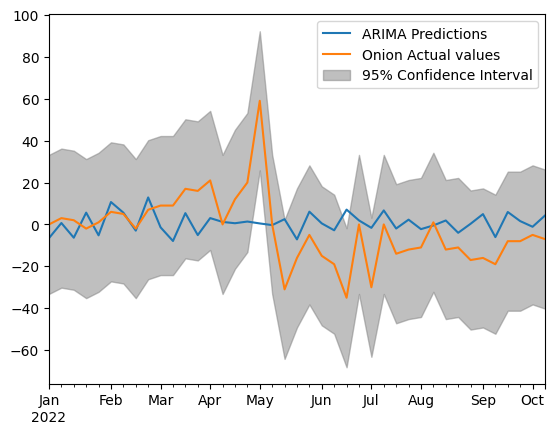

In [30]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Onion'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Onion'] - 1.96 * std_dev
upper_bound = test['Onion'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Onion'].plot(legend=True, label='Onion Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [32]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Onion'].mean()
rmse=sqrt(mean_squared_error(pred,test['Onion']))
print(rmse)

17.054640822979625

### Cucumber Forecasting

In [33]:
stepwise_fit = auto_arima(df_arima['Cucumber'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2675.909, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3056.503, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2679.041, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2840.280, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4088.357, Time=0.00 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2674.043, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2752.799, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2674.475, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2675.665, Time=0.12 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2726.610, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2675.081, Time=0.26 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2677.562, Time=0.18 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2691.450, Time=0.06 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0] intercept
Total fit time: 1.339 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(1, 0, 2)   Log Likelihood               -1332.022
Date:                Fri, 28 Jul 2023   AIC                           2674.043
Time:                        13:57:38   BIC                           2691.885
Sample:                             0   HQIC                          2681.214
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     73.0507     34.110      2.142      0.032       6.197     139.905
ar.L1          0.8749      0.061     14.415      0.000       0.756       0.994
ma.L1          0.1289      0.067      1.921      0.055      -0.003       0.260
ma.L2         -0.1203      0.075     -1.596      0.111      -0.268       0.027
sigma2      1516.7133     59.657     25.424      0.000    1399.787    1633.639
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):             10819.78
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               1.65   Skew:                             4.15
Prob(H) (two-sided):                  0.02   Kurtosis:                        33.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [34]:
model = ARIMA(train['Cucumber'],order=(30,1,20))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               Cucumber   No. Observations:                  222
Model:               ARIMA(30, 1, 20)   Log Likelihood               -1126.270
Date:                Fri, 28 Jul 2023   AIC                           2354.540
Time:                        13:57:48   BIC                           2527.846
Sample:                             0   HQIC                          2424.518
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0047      8.988      0.001      1.000     -17.612      17.621
ar.L2          0.0725      5.514      0.013      0.990     -10.735      10.880
ar.L3         -0.4939      4.489     -0.110      0.912      -9.291       8.303
ar.L4         -0.5409      1.670     -0.324      0.746      -3.814       2.732
ar.L5         -0.0918      6.180     -0.015      0.988     -12.205      12.021
ar.L6         -0.1445      3.379     -0.043      0.966      -6.767       6.478
ar.L7         -0.4025      4.178     -0.096      0.923      -8.592       7.787
ar.L8         -0.1164      1.419     -0.082      0.935      -2.898       2.665
ar.L9         -0.0655      2.286     -0.029      0.977      -4.546       4.415
ar.L10        -0.1291      1.295     -0.100      0.921      -2.668       2.410
ar.L11        -0.0730      2.041     -0.036      0.971      -4.073       3.927
ar.L12        -0.1275      1.271     -0.100      0.920      -2.618       2.363
ar.L13         0.2896      2.238      0.129      0.897      -4.097       4.677
ar.L14         0.0081      4.339      0.002      0.999      -8.496       8.512
ar.L15        -0.0918      2.942     -0.031      0.975      -5.858       5.675
ar.L16        -0.1281      2.124     -0.060      0.952      -4.291       4.035
ar.L17         0.4862      3.186      0.153      0.879      -5.758       6.731
ar.L18         0.0533      6.901      0.008      0.994     -13.473      13.580
ar.L19        -0.2267      4.598     -0.049      0.961      -9.238       8.784
ar.L20         0.1915      2.685      0.071      0.943      -5.071       5.454
ar.L21        -0.1493      1.356     -0.110      0.912      -2.807       2.508
ar.L22        -0.0132      0.547     -0.024      0.981      -1.086       1.060
ar.L23        -0.0488      0.642     -0.076      0.939      -1.308       1.210
ar.L24        -0.1080      0.308     -0.351      0.725      -0.711       0.495
ar.L25        -0.1789      0.941     -0.190      0.849      -2.023       1.665
ar.L26        -0.0668      1.031     -0.065      0.948      -2.088       1.954
ar.L27        -0.0114      0.426     -0.027      0.979      -0.847       0.824
ar.L28        -0.1244      0.298     -0.418      0.676      -0.708       0.459
ar.L29        -0.1858      1.043     -0.178      0.859      -2.230       1.858
ar.L30        -0.0635      1.245     -0.051      0.959      -2.503       2.376
ma.L1          0.0270      9.704      0.003      0.998     -18.992      19.046
ma.L2         -0.2886      7.632     -0.038      0.970     -15.247      14.670
ma.L3          0.3484      4.967      0.070      0.944      -9.387      10.084
ma.L4          0.4773      5.802      0.082      0.934     -10.893      11.848
ma.L5         -0.0597      9.034     -0.007      0.995     -17.767      17.647
ma.L6         -0.0749      8.925     -0.008      0.993     -17.568      17.418
ma.L7          0.2144      8.285      0.026      0.979     -16.024      16.453
ma.L8          0.0163      8.716      0.002      0.999     -17.066      17.099
ma

In [35]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    623.066025
2022-01-10    622.530568
2022-01-17    631.945072
2022-01-24    616.932315
2022-01-31    552.834100
2022-02-07    524.379720
2022-02-14    529.274125
2022-02-21    545.931386
2022-02-28    536.593650
2022-03-07    524.754405
2022-03-14    531.861725
2022-03-21    553.759408
2022-03-28    596.705591
2022-04-04    627.957749
2022-04-11    623.014893
2022-04-18    613.497434
2022-04-25    583.030198
2022-05-02    553.780672
2022-05-09    539.198776
2022-05-16    546.320617
2022-05-23    577.891439
2022-05-30    567.500587
2022-06-06    562.016070
2022-06-13    566.065037
2022-06-20    578.841164
2022-06-27    604.222852
2022-07-04    611.789834
2022-07-11    606.605916
2022-07-18    603.643522
2022-07-25    608.230016
2022-08-01    613.767588
2022-08-08    599.845086
2022-08-15    594.562132
2022-08-22    600.903554
2022-08-29    590.792260
2022-09-05    582.013547
2022-09-12    566.160998
2022-09-19    577.284395
2022-09-26    589.600183
2022-10-03    598.506479
2022-10-10    603.420245
Name: ARIMA Predictions, dtype: float64

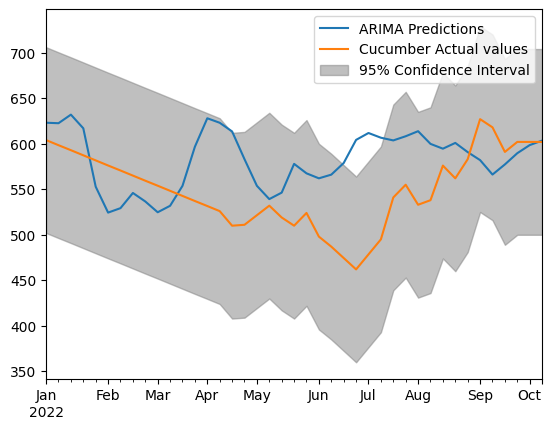

In [36]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Cucumber'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Cucumber'] - 1.96 * std_dev
upper_bound = test['Cucumber'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Cucumber'].plot(legend=True, label='Cucumber Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [34]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Cucumber'].mean()
rmse=sqrt(mean_squared_error(pred,test['Cucumber']))
print(rmse)

61.07955709274213

### Tomato Forecasting

In [37]:
stepwise_fit = auto_arima(df_arima['Tomato'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2479.885, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3208.675, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2557.378, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2905.987, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4194.840, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2496.460, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2490.185, Time=0.14 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2493.475, Time=0.27 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2480.144, Time=0.38 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2504.345, Time=0.13 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2495.450, Time=0.19 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2491.802, Time=0.30 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=2491.941, Time=0.39 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2509.079, Time=0.06 sec

Best model:  ARIMA(2,0,2)(0,0,0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(2, 0, 2)   Log Likelihood               -1233.943
Date:                Fri, 28 Jul 2023   AIC                           2479.885
Time:                        13:58:51   BIC                           2501.295
Sample:                             0   HQIC                          2488.490
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     13.3418      2.768      4.820      0.000       7.917      18.767
ar.L1          1.9411      0.020     94.698      0.000       1.901       1.981
ar.L2         -0.9598      0.020    -49.048      0.000      -0.998      -0.921
ma.L1         -0.6141      0.044    -13.919      0.000      -0.701      -0.528
ma.L2         -0.3243      0.040     -8.169      0.000      -0.402      -0.247
sigma2       719.1668     43.785     16.425      0.000     633.351     804.983
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):               269.84
Prob(Q):                              0.75   Prob(JB):                         0.00
Heteroskedasticity (H):               1.20   Skew:                             0.37
Prob(H) (two-sided):                  0.39   Kurtosis:                         7.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [38]:
model = ARIMA(train['Tomato'],order=(30,1,20))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 Tomato   No. Observations:                  222
Model:               ARIMA(30, 1, 20)   Log Likelihood               -1025.274
Date:                Fri, 28 Jul 2023   AIC                           2152.547
Time:                        13:59:00   BIC                           2325.854
Sample:                             0   HQIC                          2222.525
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0644      0.560     -0.115      0.909      -1.162       1.034
ar.L2         -0.3909      0.511     -0.764      0.445      -1.393       0.611
ar.L3          0.0153      0.394      0.039      0.969      -0.756       0.787
ar.L4          0.2117      0.430      0.492      0.623      -0.632       1.055
ar.L5          0.0554      0.517      0.107      0.915      -0.958       1.069
ar.L6          0.2225      0.533      0.417      0.677      -0.823       1.268
ar.L7         -0.1383      0.321     -0.430      0.667      -0.768       0.492
ar.L8          0.2191      0.292      0.750      0.453      -0.353       0.792
ar.L9         -0.3469      0.294     -1.178      0.239      -0.924       0.230
ar.L10         0.0775      0.390      0.199      0.842      -0.687       0.842
ar.L11         0.1489      0.391      0.381      0.703      -0.617       0.915
ar.L12         0.2211      0.388      0.569      0.569      -0.540       0.982
ar.L13         0.2401      0.293      0.818      0.413      -0.335       0.815
ar.L14         0.2519      0.337      0.747      0.455      -0.409       0.913
ar.L15        -0.1205      0.393     -0.307      0.759      -0.890       0.649
ar.L16        -0.1484      0.405     -0.366      0.714      -0.943       0.646
ar.L17        -0.2081      0.376     -0.554      0.580      -0.945       0.529
ar.L18        -0.1580      0.303     -0.521      0.602      -0.752       0.436
ar.L19        -0.0896      0.365     -0.245      0.806      -0.805       0.626
ar.L20        -0.1160      0.283     -0.409      0.682      -0.671       0.439
ar.L21        -0.0282      0.235     -0.120      0.904      -0.489       0.432
ar.L22        -0.0010      0.233     -0.004      0.996      -0.459       0.457
ar.L23        -0.1347      0.234     -0.576      0.564      -0.593       0.323
ar.L24        -0.0788      0.234     -0.337      0.736      -0.538       0.380
ar.L25        -0.0104      0.215     -0.049      0.961      -0.431       0.410
ar.L26        -0.0528      0.209     -0.253      0.800      -0.462       0.357
ar.L27         0.1318      0.187      0.706      0.480      -0.234       0.498
ar.L28         0.0169      0.183      0.092      0.927      -0.342       0.376
ar.L29        -0.0591      0.190     -0.311      0.755      -0.431       0.313
ar.L30        -0.1168      0.185     -0.633      0.527      -0.479       0.245
ma.L1          0.4301      1.463      0.294      0.769      -2.438       3.298
ma.L2          0.4193      0.795      0.528      0.598      -1.138       1.976
ma.L3          0.0442      0.851      0.052      0.959      -1.624       1.712
ma.L4         -0.3609      0.926     -0.390      0.697      -2.177       1.455
ma.L5         -0.4207      1.564     -0.269      0.788      -3.487       2.646
ma.L6         -0.5592      1.502     -0.372      0.710      -3.504       2.385
ma.L7         -0.2476      1.755     -0.141      0.888      -3.687       3.191
ma.L8         -0.4024      1.216     -0.331      0.741      -2.785       1.981
ma

In [39]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    782.792963
2022-01-10    801.571326
2022-01-17    799.300965
2022-01-24    793.431905
2022-01-31    770.512837
2022-02-07    743.181340
2022-02-14    715.284089
2022-02-21    699.484836
2022-02-28    701.614137
2022-03-07    691.556530
2022-03-14    658.255614
2022-03-21    630.689005
2022-03-28    616.381700
2022-04-04    591.545656
2022-04-11    581.312146
2022-04-18    589.239104
2022-04-25    603.408185
2022-05-02    605.310334
2022-05-09    604.884675
2022-05-16    610.798673
2022-05-23    610.042959
2022-05-30    609.449418
2022-06-06    622.218134
2022-06-13    621.269992
2022-06-20    598.559493
2022-06-27    593.160409
2022-07-04    613.702788
2022-07-11    637.001158
2022-07-18    651.557601
2022-07-25    665.713259
2022-08-01    683.831693
2022-08-08    688.365650
2022-08-15    690.076079
2022-08-22    708.106122
2022-08-29    723.924568
2022-09-05    722.831746
2022-09-12    719.962305
2022-09-19    718.549952
2022-09-26    719.848412
2022-10-03    730.772604
2022-10-10    749.464621
Name: ARIMA Predictions, dtype: float64

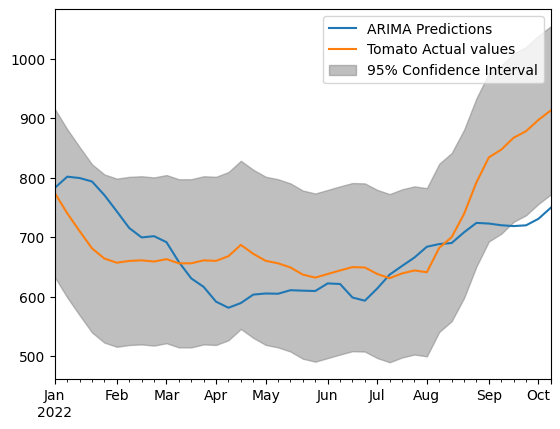

In [40]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Tomato'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Tomato'] - 1.96 * std_dev
upper_bound = test['Tomato'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Tomato'].plot(legend=True, label='Tomato Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [41]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Tomato'].mean()
rmse=sqrt(mean_squared_error(pred,test['Tomato']))
print(rmse)

75.39998642372431

### Chinese_Cabbage Forecasting

In [42]:
stepwise_fit = auto_arima(df_arima['Chinese_Cabbage'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1935.015, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2043.522, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1930.934, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1954.715, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2041.588, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1932.908, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1932.900, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1933.649, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1928.963, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=1930.937, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1930.929, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1952.764, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1931.679, Time=0.09 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 0.763 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(1, 1, 0)   Log Likelihood                -962.482
Date:                Fri, 28 Jul 2023   AIC                           1928.963
Time:                        14:00:01   BIC                           1936.093
Sample:                             0   HQIC                          1931.829
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5953      0.023     25.481      0.000       0.550       0.641
sigma2        93.2963      3.265     28.576      0.000      86.897      99.695
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):              1386.33
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.50   Skew:                            -1.18
Prob(H) (two-sided):                  0.00   Kurtosis:                        14.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [43]:
model = ARIMA(train['Chinese_Cabbage'],order=(30,1,10))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:        Chinese_Cabbage   No. Observations:                  222
Model:               ARIMA(30, 1, 10)   Log Likelihood                -816.435
Date:                Fri, 28 Jul 2023   AIC                           1714.870
Time:                        14:00:08   BIC                           1854.194
Sample:                             0   HQIC                          1771.127
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5625      1.067      0.527      0.598      -1.529       2.655
ar.L2         -0.0791      0.691     -0.114      0.909      -1.434       1.275
ar.L3          0.0559      0.390      0.143      0.886      -0.709       0.821
ar.L4          0.8075      0.313      2.581      0.010       0.194       1.421
ar.L5         -0.9150      0.857     -1.067      0.286      -2.596       0.766
ar.L6          0.1981      1.125      0.176      0.860      -2.008       2.404
ar.L7          0.1335      0.614      0.217      0.828      -1.071       1.338
ar.L8         -0.3233      0.362     -0.894      0.371      -1.032       0.386
ar.L9          0.7442      0.453      1.643      0.100      -0.143       1.632
ar.L10        -0.2492      0.837     -0.298      0.766      -1.890       1.392
ar.L11        -0.1714      0.544     -0.315      0.753      -1.238       0.896
ar.L12         0.0773      0.268      0.288      0.773      -0.448       0.603
ar.L13         0.0482      0.293      0.164      0.869      -0.526       0.622
ar.L14        -0.0528      0.292     -0.181      0.856      -0.625       0.519
ar.L15         0.0651      0.282      0.231      0.817      -0.487       0.617
ar.L16        -0.2001      0.307     -0.653      0.514      -0.801       0.401
ar.L17        -0.0173      0.369     -0.047      0.963      -0.741       0.707
ar.L18         0.1255      0.342      0.367      0.714      -0.545       0.795
ar.L19        -0.0669      0.332     -0.202      0.840      -0.717       0.583
ar.L20         0.1245      0.323      0.386      0.700      -0.508       0.757
ar.L21        -0.1852      0.289     -0.641      0.521      -0.751       0.381
ar.L22        -0.0845      0.351     -0.241      0.810      -0.772       0.603
ar.L23         0.1032      0.319      0.324      0.746      -0.522       0.728
ar.L24        -0.0646      0.329     -0.196      0.844      -0.709       0.580
ar.L25         0.2241      0.249      0.902      0.367      -0.263       0.711
ar.L26        -0.0425      0.284     -0.150      0.881      -0.599       0.514
ar.L27        -0.0809      0.239     -0.338      0.735      -0.550       0.388
ar.L28         0.0509      0.235      0.217      0.828      -0.409       0.511
ar.L29        -0.2392      0.191     -1.255      0.210      -0.613       0.134
ar.L30         0.1522      0.259      0.589      0.556      -0.355       0.659
ma.L1          0.0013      1.095      0.001      0.999      -2.146       2.148
ma.L2         -0.0021      0.320     -0.007      0.995      -0.629       0.625
ma.L3          0.0637      0.369      0.173      0.863      -0.660       0.787
ma.L4         -0.8532      0.344     -2.477      0.013      -1.528      -0.178
ma.L5          0.4831      0.878      0.550      0.582      -1.237       2.204
ma.L6          0.0953      0.785      0.121      0.903      -1.443       1.634
ma.L7         -0.1397      0.393     -0.355      0.722      -0.910       0.631
ma.L8          0.2622      0.387      0.677      0.498      -0.496       1.021
ma

In [44]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    131.205590
2022-01-10    129.390708
2022-01-17    129.312512
2022-01-24    133.914762
2022-01-31    141.418572
2022-02-07    145.543648
2022-02-14    150.471212
2022-02-21    151.340305
2022-02-28    162.105424
2022-03-07    175.037161
2022-03-14    186.000939
2022-03-21    192.057008
2022-03-28    193.191861
2022-04-04    190.142184
2022-04-11    189.281453
2022-04-18    189.515434
2022-04-25    200.573254
2022-05-02    211.996347
2022-05-09    220.528474
2022-05-16    223.095955
2022-05-23    227.440675
2022-05-30    232.653530
2022-06-06    232.207158
2022-06-13    232.023093
2022-06-20    234.892679
2022-06-27    236.970712
2022-07-04    235.311423
2022-07-11    234.933238
2022-07-18    236.586794
2022-07-25    240.749545
2022-08-01    241.263624
2022-08-08    240.227568
2022-08-15    235.904876
2022-08-22    235.650501
2022-08-29    236.749622
2022-09-05    235.468191
2022-09-12    233.922835
2022-09-19    232.791935
2022-09-26    231.069266
2022-10-03    225.606474
2022-10-10    222.278316
Name: ARIMA Predictions, dtype: float64

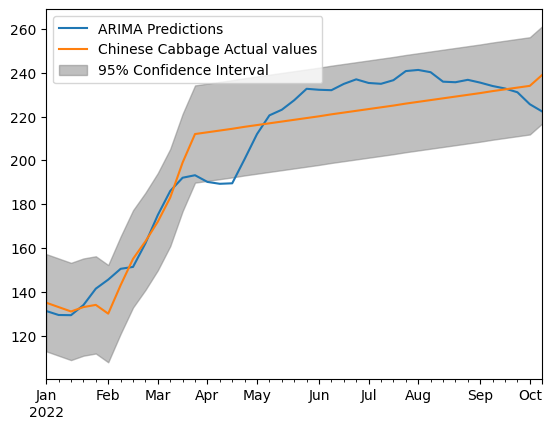

In [45]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Chinese_Cabbage'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Chinese_Cabbage'] - 1.96 * std_dev
upper_bound = test['Chinese_Cabbage'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Chinese_Cabbage'].plot(legend=True, label='Chinese Cabbage Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [46]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Chinese_Cabbage'].mean()
rmse=sqrt(mean_squared_error(pred,test['Chinese_Cabbage']))
print(rmse)

11.30370180570708

### Radish Forecasting

In [47]:
stepwise_fit = auto_arima(df_arima['Radish'], trace=True,
                          suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1858.802, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2718.199, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1949.086, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2402.741, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3483.065, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1860.680, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1857.179, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1871.930, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1856.181, Time=0.06 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1857.335, Time=0.11 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1859.046, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.964 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  262
Model:               SARIMAX(2, 0, 0)   Log Likelihood                -924.091
Date:                Fri, 28 Jul 2023   AIC                           1856.181
Time:                        14:01:37   BIC                           1870.455
Sample:                             0   HQIC                          1861.918
                                - 262                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      7.4905      1.844      4.062      0.000       3.876      11.105
ar.L1          1.5112      0.034     44.995      0.000       1.445       1.577
ar.L2         -0.5521      0.031    -17.535      0.000      -0.614      -0.490
sigma2        66.8342      2.367     28.230      0.000      62.194      71.474
===================================================================================
Ljung-Box (L1) (Q):                   0.36   Jarque-Bera (JB):              1234.33
Prob(Q):                              0.55   Prob(JB):                         0.00
Heteroskedasticity (H):               0.23   Skew:                            -0.01
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [48]:
model = ARIMA(train['Radish'],order=(4,0,0))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 Radish   No. Observations:                  222
Model:                 ARIMA(4, 0, 0)   Log Likelihood                -794.537
Date:                Fri, 28 Jul 2023   AIC                           1601.075
Time:                        14:01:37   BIC                           1621.491
Sample:                             0   HQIC                          1609.317
                                - 222                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        175.5147     14.429     12.164      0.000     147.234     203.796
ar.L1          1.5369      0.038     40.679      0.000       1.463       1.611
ar.L2         -0.6570      0.070     -9.339      0.000      -0.795      -0.519
ar.L3          0.1257      0.112      1.118      0.264      -0.095       0.346
ar.L4         -0.0554      0.066     -0.838      0.402      -0.185       0.074
sigma2        74.0063      3.081     24.019      0.000      67.967      80.045
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               880.26
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               0.58   Skew:                             0.20
Prob(H) (two-sided):                  0.02   Kurtosis:                        12.75
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [49]:
start = len(train)
end = len(train) + len(test) - 1
pred = model.predict(start=start, end=end, typ='levels').rename('ARIMA Predictions')
pred.index = test.index
print(pred)

2022-01-03    168.099947
2022-01-10    174.688962
2022-01-17    178.894737
2022-01-24    181.345271
2022-01-31    182.562004
2022-02-07    182.985871
2022-02-14    182.913090
2022-02-21    182.540002
2022-02-28    182.000316
2022-03-07    181.383351
2022-03-14    180.746822
2022-03-21    180.126682
2022-03-28    179.544097
2022-04-04    179.010281
2022-04-11    178.529893
2022-04-18    178.103391
2022-04-25    177.728656
2022-05-02    177.402097
2022-05-09    177.119386
2022-05-16    176.875937
2022-05-23    176.667214
2022-05-30    176.488912
2022-06-06    176.337055
2022-06-13    176.208049
2022-06-20    176.098689
2022-06-27    176.006152
2022-07-04    175.927970
2022-07-11    175.862002
2022-07-18    175.806403
2022-07-25    175.759588
2022-08-01    175.720202
2022-08-08    175.687089
2022-08-15    175.659267
2022-08-22    175.635904
2022-08-29    175.616293
2022-09-05    175.599838
2022-09-12    175.586036
2022-09-19    175.574463
2022-09-26    175.564761
2022-10-03    175.556630
2022-10-10    175.549816
Name: ARIMA Predictions, dtype: float64

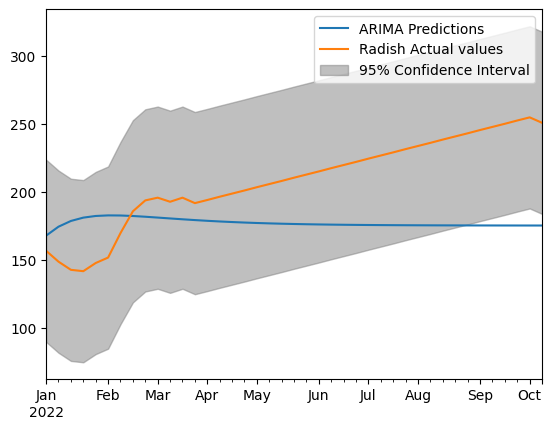

In [50]:
# Calculate the standard deviation of the prediction errors
prediction_errors = test['Radish'] - pred
std_dev = prediction_errors.std()

# Calculate the 95% confidence interval for the actual values
lower_bound = test['Radish'] - 1.96 * std_dev
upper_bound = test['Radish'] + 1.96 * std_dev

# Plot the actual values and the predictions with the confidence interval
pred.plot(legend=True)
test['Radish'].plot(legend=True, label='Radish Actual values')
plt.fill_between(test.index, lower_bound, upper_bound, color='gray', alpha=0.5, label='95% Confidence Interval')
plt.legend()
plt.show()

In [51]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Radish'].mean()
rmse=sqrt(mean_squared_error(pred,test['Radish']))
print(rmse)

45.616921435523224

In [10]:
import seaborn as sns

In [12]:
df_arima.corr()

,Cabbage,Green_Onion,Lettuce,Potatoes,Onion,Cucumber,Tomato,Chinese_Cabbage,Radish
Cabbage,1.000000,0.195209,0.680728,-0.103850,-0.023599,0.081966,0.094685,0.661477,0.745239
Green_Onion,0.195209,1.000000,0.178143,-0.066265,-0.029291,0.339535,0.156640,0.428144,0.435024
Lettuce,0.680728,0.178143,1.000000,-0.054832,0.017520,0.306148,0.400006,0.372198,0.585377
Potatoes,-0.103850,-0.066265,-0.054832,1.000000,-0.361200,0.042944,-0.008570,-0.090261,-0.079661
Onion,-0.023599,-0.029291,0.017520,-0.361200,1.000000,-0.042360,-0.017524,-0.012039,-0.035503
Cucumber,0.081966,0.339535,0.306148,0.042944,-0.042360,1.000000,0.619212,0.081472,0.105223
Tomato,0.094685,0.156640,0.400006,-0.008570,-0.017524,0.619212,1.000000,0.095211,0.230755
Chinese_Cabbage,0.661477,0.428144,0.372198,-0.090261,-0.012039,0.081472,0.095211,1.000000,0.764062
Radish,0.745239,0.435024,0.585377,-0.079661,-0.035503,0.105223,0.230755,0.764062,1.000000


# LIME

In [50]:
def explain_columns(df_arima):
    for column in df_arima.columns:
        # Calculate the correlation matrix between columns
        corr_matrix = df_arima.corr()

        # Finding the 3 variables with the highest absolute value for the relevant column
        absolute_values = corr_matrix[column].abs().nlargest(4)[1:]

        # Results
        print('-------------------------------------------------------------------------------------------------------------------')
        print(f"[bold]Highest Absolute Correlation Values for {column}:")
        for variable in absolute_values.index:
            corr = corr_matrix.loc[column, variable]
            pos_neg = "Positive" if corr > 0 else "Negative"
            print(f"{variable}: {pos_neg}, Correlation Value: {corr}")
            
        print('\n')

        X = df_arima.drop(column, axis=1)  # Independent variables
        y = df_arima[column]  # Target variable

        # RFE model
        model = LinearRegression()  # Linear Regression model is used
        rfe = RFE(estimator=model, n_features_to_select=3)  # To select 3 features

        # Training the RFE model and feature selection
        X_selected = rfe.fit_transform(X, y)

        # Get indexes of selected features
        selected_feature_indexes = rfe.get_support(indices=True)

        # Get the names of selected features
        selected_features = X.columns[selected_feature_indexes]

        # Results
        print(f"[bold]Selected Features for {column}:")
        for feature in selected_features:
            print(f"{feature}")
            
        print('\n')

        # Creating the explainer object for LIME
        explainer = lime.lime_tabular.LimeTabularExplainer(
            X_selected, feature_names=selected_features, class_names=[column], mode='regression')

        # Selecting sample data point
        data_point = X_selected[0]  # first data point is used

        # Creating a Linear Regression model
        model = LinearRegression()

        # Training the model
        model.fit(X_selected, y)

        # Create the LIME explanation
        lime_explanation = explainer.explain_instance(
            data_point, model.predict, num_features=3)  # To show the 3 selected features

        # Print the explanations
        lime_explanation.show_in_notebook()  # To show in Jupyter notebook

explain_columns(df_arima)

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Cabbage:

Radish: Positive, Correlation Value: 0.7452388921471886

Lettuce: Positive, Correlation Value: 0.680728082623357

Chinese_Cabbage: Positive, Correlation Value: 0.6614769339168624

Selected Features for Cabbage:

Lettuce

Chinese_Cabbage

Radish

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Green_Onion:

Radish: Positive, Correlation Value: 0.4350238714797491

Chinese_Cabbage: Positive, Correlation Value: 0.4281435540229183

Cucumber: Positive, Correlation Value: 0.33953490562546135

Selected Features for Green_Onion:

Cabbage

Chinese_Cabbage

Radish

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Lettuce:

Cabbage: Positive, Correlation Value: 0.680728082623357

Radish: Positive, Correlation Value: 0.5853773550549886

Tomato: Positive, Correlation Value: 0.40000630487981004

Selected Features for Lettuce:

Cabbage

Chinese_Cabbage

Radish

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Potatoes:

Onion: Negative, Correlation Value: -0.3612002371999436

Cabbage: Negative, Correlation Value: -0.10385027061083044

Chinese_Cabbage: Negative, Correlation Value: -0.090261341152835

Selected Features for Potatoes:

Cabbage

Onion

Cucumber

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Onion:

Potatoes: Negative, Correlation Value: -0.3612002371999436

Cucumber: Negative, Correlation Value: -0.04235967901163206

Radish: Negative, Correlation Value: -0.035503456353462505

Selected Features for Onion:

Cabbage

Potatoes

Radish

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Cucumber:

Tomato: Positive, Correlation Value: 0.6192123208655781

Green_Onion: Positive, Correlation Value: 0.33953490562546135

Lettuce: Positive, Correlation Value: 0.30614842030582556

Selected Features for Cucumber:

Cabbage

Tomato

Radish

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Tomato:

Cucumber: Positive, Correlation Value: 0.6192123208655781

Lettuce: Positive, Correlation Value: 0.40000630487981004

Radish: Positive, Correlation Value: 0.23075462196047825

Selected Features for Tomato:

Cabbage

Cucumber

Radish

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Chinese_Cabbage:

Radish: Positive, Correlation Value: 0.7640619958365827

Cabbage: Positive, Correlation Value: 0.6614769339168624

Green_Onion: Positive, Correlation Value: 0.4281435540229183

Selected Features for Chinese_Cabbage:

Cabbage

Green_Onion

Radish

-------------------------------------------------------------------------------------------------------------------

Highest Absolute Correlation Values for Radish:

Chinese_Cabbage: Positive, Correlation Value: 0.7640619958365827

Cabbage: Positive, Correlation Value: 0.7452388921471886

Lettuce: Positive, Correlation Value: 0.5853773550549886

Selected Features for Radish:

Cabbage

Tomato

Chinese_Cabbage